# ARCHS4 module-trait association analysis

In [1]:
library(here)
library(dplyr)
library(hdf5r)
library(preprocessCore)
library(rhdf5)

here() starts at /home/msubirana/Documents/pivlab/plier2-analyses




Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘rhdf5’


The following object is masked from ‘package:hdf5r’:

    h5version




## Load ARCHS4

In [2]:
archs4_traits  <- readRDS(here('data/archs4/traits/archs4-phenoplier.rds'))
archs4_plier2 <- readRDS(here('data/archs4/model/archs4/archs4_PLIER2.rds'))

## Load GTEx

In [ ]:
url <- config$GTEx$URL
dest_dir <-  config$GTEx$DATASET_FOLDER
dest_gz  <- file.path(dest_dir, basename(url))

if (!file.exists(dest_gz)) {
  dir.create(dest_dir, recursive = TRUE, showWarnings = FALSE)
  download.file(url, dest_gz, mode = "wb")
  message("Downloaded to: ", dest_gz)
} else {
  message("File already exists, skipping download.")
}

exprs_path  <- file.path(config$GTEx$DATASET_FOLDER, 'GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct.gz')
output_file <- config$GTEx$DATASET_FILE

if (!file.exists(output_file)) {
  dir.create(dirname(output_file), recursive = TRUE, showWarnings = FALSE)
  exprs_data <- read.table(exprs_path, header = TRUE, sep = "\t", skip = 2, check.names = FALSE)
  saveRDS(exprs_data, config$GTEx$DATASET_FILE)
  message("File successfully written to: ", config$GTEx$DATASET_FILE)
} else {
  message("Output file already exists. Skipping.")
}

# Aggregate in-place by 'description'
gtex <- readRDS(here(config$GTEx$DATASET_FILE))
gtex <- as.data.table(gtex)
aggregated_gtex <- gtex[, lapply(.SD, sum), by = Description, .SDcols = is.numeric]

genes <- aggregated_gtex$Description
samples <- colnames(aggregated_gtex[, -1])
data_mat <- as.matrix(aggregated_gtex[, -1])

In [3]:
archs4_b <- as.data.frame(as.matrix(archs4_plier2$B))

Loading required package: Matrix



In [4]:
dim(archs4_b)

[1]   2366 605614

In [5]:
colnames(archs4_b)

[1] "V1"     "V2"     "V3"     "V4"     "V5"     "V6"     "V7"     "V8"    
    [9] "V9"     "V10"    "V11"    "V12"    "V13"    "V14"    "V15"    "V16"   
   [17] "V17"    "V18"    "V19"    "V20"    "V21"    "V22"    "V23"    "V24"   
   [25] "V25"    "V26"    "V27"    "V28"    "V29"    "V30"    "V31"    "V32"   
   [33] "V33"    "V34"    "V35"    "V36"    "V37"    "V38"    "V39"    "V40"   
   [41] "V41"    "V42"    "V43"    "V44"    "V45"    "V46"    "V47"    "V48"   
   [49] "V49"    "V50"    "V51"    "V52"    "V53"    "V54"    "V55"    "V56"   
   [57] "V57"    "V58"    "V59"    "V60"    "V61"    "V62"    "V63"    "V64"   
   [65] "V65"    "V66"    "V67"    "V68"    "V69"    "V70"    "V71"    "V72"   
   [73] "V73"    "V74"    "V75"    "V76"    "V77"    "V78"    "V79"    "V80"   
   [81] "V81"    "V82"    "V83"    "V84"    "V85"    "V86"    "V87"    "V88"   
   [89] "V89"    "V90"    "V91"    "V92"    "V93"    "V94"    "V95"    "V96"   
   [97] "V97"    "V98"    "V99"    "V100"   "V101"   "V102"   "V103"   "V104"  
  [105] "V105"   "V106"   "V107"   "V108"   "V109"   "V110"   "V111"   "V112"  
  [113] "V113"   "V114"   "V115"   "V116"   "V117"   "V118"   "V119"   "V120"  
  [121] "V121"   "V122"   "V123"   "V124"   "V125"   "V126"   "V127"   "V128"  
  [129] "V129"   "V130"   "V131"   "V132"   "V133"   "V134"   "V135"   "V136"  
  [137] "V137"   "V138"   "V139"   "V140"   "V141"   "V142"   "V143"   "V144"  
  [145] "V145"   "V146"   "V147"   "V148"   "V149"   "V150"   "V151"   "V152"  
  [153] "V153"   "V154"   "V155"   "V156"   "V157"   "V158"   "V159"   "V160"  
  [161] "V161"   "V162"   "V163"   "V164"   "V165"   "V166"   "V167"   "V168"  
  [169] "V169"   "V170"   "V171"   "V172"   "V173"   "V174"   "V175"   "V176"  
  [177] "V177"   "V178"   "V179"   "V180"   "V181"   "V182"   "V183"   "V184"  
  [185] "V185"   "V186"   "V187"   "V188"   "V189"   "V190"   "V191"   "V192"  
  [193] "V193"   "V194"   "V195"   "V196"   "V197"   "V198"   "V199"   "V200"  
  [201] "V201"   "V202"   "V203"   "V204"   "V205"   "V206"   "V207"   "V208"  
  [209] "V209"   "V210"   "V211"   "V212"   "V213"   "V214"   "V215"   "V216"  
  [217] "V217"   "V218"   "V219"   "V220"   "V221"   "V222"   "V223"   "V224"  
  [225] "V225"   "V226"   "V227"   "V228"   "V229"   "V230"   "V231"   "V232"  
  [233] "V233"   "V234"   "V235"   "V236"   "V237"   "V238"   "V239"   "V240"  
  [241] "V241"   "V242"   "V243"   "V244"   "V245"   "V246"   "V247"   "V248"  
  [249] "V249"   "V250"   "V251"   "V252"   "V253"   "V254"   "V255"   "V256"  
  [257] "V257"   "V258"   "V259"   "V260"   "V261"   "V262"   "V263"   "V264"  
  [265] "V265"   "V266"   "V267"   "V268"   "V269"   "V270"   "V271"   "V272"  
  [273] "V273"   "V274"   "V275"   "V276"   "V277"   "V278"   "V279"   "V280"  
  [281] "V281"   "V282"   "V283"   "V284"   "V285"   "V286"   "V287"   "V288"  
  [289] "V289"   "V290"   "V291"   "V292"   "V293"   "V294"   "V295"   "V296"  
  [297] "V297"   "V298"   "V299"   "V300"   "V301"   "V302"   "V303"   "V304"  
  [305] "V305"   "V306"   "V307"   "V308"   "V309"   "V310"   "V311"   "V312"  
  [313] "V313"   "V314"   "V315"   "V316"   "V317"   "V318"   "V319"   "V320"  
  [321] "V321"   "V322"   "V323"   "V324"   "V325"   "V326"   "V327"   "V328"  
  [329] "V329"   "V330"   "V331"   "V332"   "V333"   "V334"   "V335"   "V336"  
  [337] "V337"   "V338"   "V339"   "V340"   "V341"   "V342"   "V343"   "V344"  
  [345] "V345"   "V346"   "V347"   "V348"   "V349"   "V350"   "V351"   "V352"  
  [353] "V353"   "V354"   "V355"   "V356"   "V357"   "V358"   "V359"   "V360"  
  [361] "V361"   "V362"   "V363"   "V364"   "V365"   "V366"   "V367"   "V368"  
  [369] "V369"   "V370"   "V371"   "V372"   "V373"   "V374"   "V375"   "V376"  
  [377] "V377"   "V378"   "V379"   "V380"   "V381"   "V382"   "V383"   "V384"  
  [385] "V385"   "V386"   "V387"   "V388"   "V389"   "V390"   "V391"   "V392"  
  [393] "V393"   "V394"   "V395"   "V396"   "V397"   "V398"   "V399"   "V400"  
  [4

In [6]:
head(archs4_traits)

,phenotype,phenotype_desc,lv,pvalue,fdr
,<fct>,<fct>,<fct>,<dbl>,<dbl>
0,6142_1,Current employment status: In paid employment or self-employed,LV2304,2.429204e-05,0.03225001
1,6142_1,Current employment status: In paid employment or self-employed,LV1700,9.843883e-05,0.08670015
2,6142_1,Current employment status: In paid employment or self-employed,LV888,2.292897e-04,0.14920390
3,6142_1,Current employment status: In paid employment or self-employed,LV19,6.149416e-04,0.25746770
4,6142_1,Current employment status: In paid employment or self-employed,LV77,1.021430e-03,0.32751241
5,6142_1,Current employment status: In paid employment or self-employed,LV403,1.589422e-03,0.39640901


In [7]:
library(hdf5r)
h5 <- H5File$new(here('data/archs4/human_gene_v2.5.h5'), mode = "r")
sc_samples <- h5[["/meta/samples/singlecellprobability"]]$read()
samples_idx <- which(sc_samples < 0.5)
id_samples <- h5[["/meta/samples/geo_accession"]]$read()
filtered_ids <- id_samples[samples_idx]
h5$close_all()

In [8]:
length(filtered_ids)==length(colnames(archs4_b))

[1] TRUE

In [9]:
colnames(archs4_b) <- filtered_ids

In [10]:
archs4_b[1:5, 1:5]

,GSM1000981,GSM1000982,GSM1000983,GSM1000984,GSM1000985
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LV1,0.07398552,0.06549906,0.08115003,0.07502413,0.06739754
LV2,-0.03746596,-0.03999266,-0.03714191,-0.03785702,-0.03428144
LV3,-0.13033351,-0.13065868,-0.13684181,-0.14037599,-0.13831017
LV4,-0.08857614,-0.08829065,-0.08617926,-0.09295446,-0.09596845
LV5,0.04987766,0.04897318,0.04881013,0.05693444,0.05454549


In [11]:
df_cell_types_info <- df_cell_types_info  %>% 
tibble::rownames_to_column('sample_id')

ERROR: Error: object 'df_cell_types_info' not found


In [ ]:
head(df_cell_types_info)

,sample_id,title,source_name_ch1,cell_type
,<chr>,<chr>,<chr>,<chr>
1,GSM1062236,t(2;14)_176_10_pt.5,Bone Marrow,bone
2,GSM1062237,t(6;14)_390_11_pt.7,Bone Marrow,bone
3,GSM1062238,NPM1+/FLT3+_48758,Bone Marrow,bone
4,GSM1062239,NPM1+/FLT3+_48792,Bone Marrow,bone
5,GSM1062240,NPM1+/FLT3+_49666,Bone Marrow,bone
6,GSM1062244,NPM1+/FLT3-_49213,Bone Marrow,bone


In [ ]:
keep_samples <- intersect(colnames(archs4_b), df_cell_types_info$sample_id)

In [ ]:
archs4_b_sub  <- archs4_b  %>% 
dplyr::select(all_of(keep_samples))

In [ ]:
archs4_b_sub[1:5, 1:5]

,GSM1002540,GSM1002541,GSM1002542,GSM1002543,GSM1002544
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LV1,-0.006721016,0.013897068,0.005593892,-0.007630979,0.001340064
LV2,-0.016045176,0.012074793,0.007398806,0.008742555,-0.009089736
LV3,0.027347892,0.036263835,0.001713800,0.015293064,0.012490010
LV4,0.003178050,0.001893254,0.012988210,0.014709068,0.013231507
LV5,-0.046149406,-0.039051053,-0.037755557,-0.044517284,-0.046468188


In [ ]:
archs4_summary_sig  <- archs4_plier2$summary %>% 
dplyr::filter(FDR < 0.05)  %>% 
dplyr::filter(AUC > 0.7)  %>% 
dplyr::select(pathway, `LV index`)  %>% 
dplyr::rename(LV = `LV index`)  %>% 
dplyr::mutate(LV = paste0('LV', LV))

head(archs4_summary_sig)

,pathway,LV
,<chr>,<chr>
1,Fibroblast Skin Mouse,LV4
2,DCLK1+ Progenitor Cell Large Intestine Human,LV6
3,Fibroblast Skin Mouse,LV6
4,Fibrocartilage Chondrocyte Articular Cartilage Human,LV6
5,Leydig Precursor Cell Fetal Gonad Human,LV6
6,Medullary Cell Kidney Mouse,LV6


In [ ]:
archs4_b_sub  <- archs4_b_sub  %>% 
dplyr::filter(row.names(archs4_b_sub) %in% archs4_summary_sig$LV)

In [ ]:
#––– libraries
library(ggplot2)
library(dplyr)
library(Rtsne)

#––– 1. PCA
# transpose so samples are rows
pca_res <- prcomp(t(archs4_b_sub), scale. = TRUE)

pca_df <- data.frame(
  sample_id = colnames(archs4_b_sub),
  PC1       = pca_res$x[,1],
  PC2       = pca_res$x[,2]
) %>%
  left_join(
    df_cell_types_info %>% select(sample_id, cell_type),
    by = "sample_id"
  )


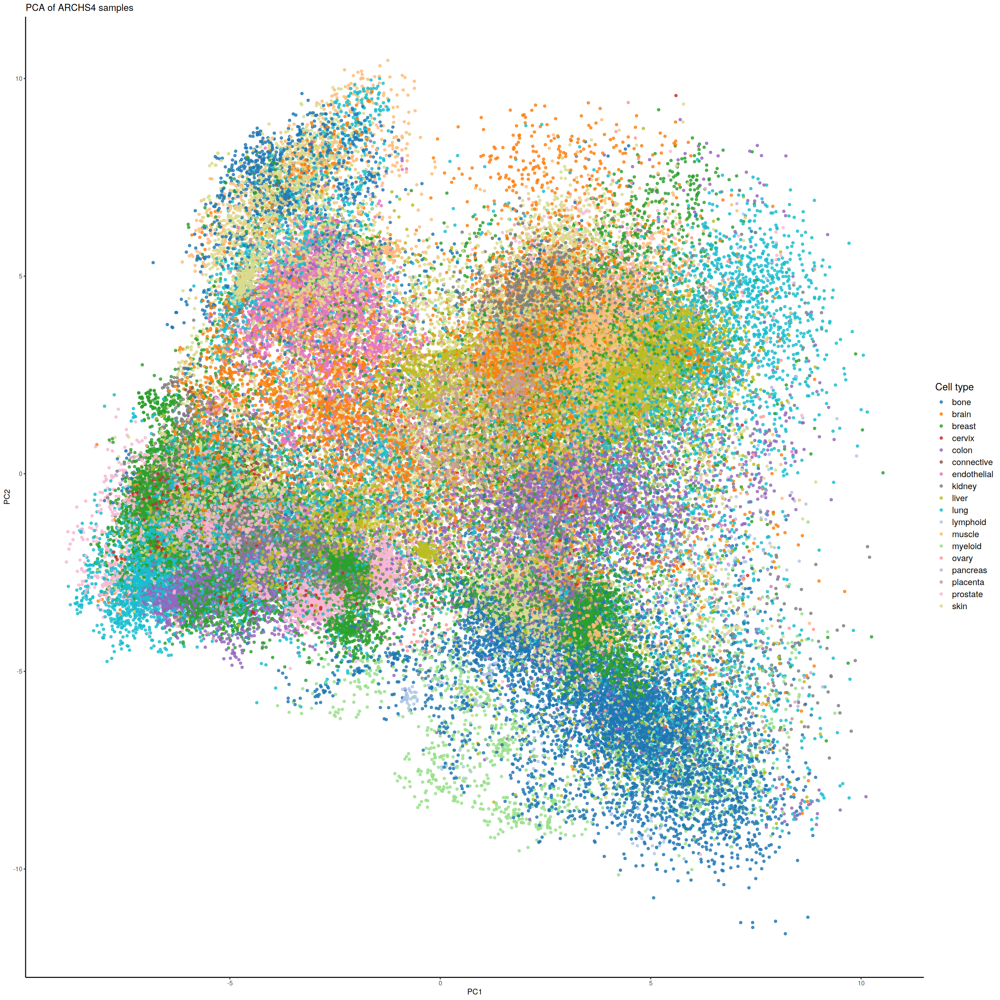

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 20)

ggplot(pca_df, aes(x = PC1, y = PC2, color = cell_type)) +
    geom_point(size = 1.2, alpha = 0.8) +
    scale_color_manual(
        values = c(
            "bone" = "#1f77b4", "brain" = "#ff7f0e", "breast" = "#2ca02c",
            "cervix" = "#d62728", "colon" = "#9467bd", "connective" = "#8c564b",
            "endothelial" = "#e377c2", "kidney" = "#7f7f7f", "liver" = "#bcbd22",
            "lung" = "#17becf", "lymphoid" = "#aec7e8", "muscle" = "#ffbb78",
            "myeloid" = "#98df8a", "ovary" = "#ff9896", "pancreas" = "#c5b0d5",
            "placenta" = "#c49c94", "prostate" = "#f7b6d2", "skin" = "#dbdb8d"
        )
    ) +
    labs(
        title = "PCA of ARCHS4 samples",
        x     = "PC1",
        y     = "PC2",
        color = "Cell type"
    ) +
    theme_classic() +
    theme(
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14)
    )

In [ ]:
library(Rtsne)
library(dplyr)
library(ggplot2)

set.seed(123)
mat_jitter <- jitter(t(archs4_b_sub), factor = 1e-6)
tsne_res <- Rtsne(mat_jitter, perplexity = 30, max_iter = 1000, verbose = TRUE, check_duplicates = FALSE)
tsne_df <- data.frame(
  sample_id = rownames(mat_jitter),
  tSNE_1    = tsne_res$Y[,1],
  tSNE_2    = tsne_res$Y[,2]
) %>%
  left_join(df_cell_types_info %>% select(sample_id, cell_type), by = "sample_id")
tsne_centroids <- tsne_df %>%
  group_by(cell_type) %>%
  summarise(tSNE_1 = mean(tSNE_1), tSNE_2 = mean(tSNE_2))


Performing PCA
Read the 104185 x 50 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 10000 of 104185
 - point 20000 of 104185
 - point 30000 of 104185
 - point 40000 of 104185
 - point 50000 of 104185
 - point 60000 of 104185
 - point 70000 of 104185
 - point 80000 of 104185
 - point 90000 of 104185
 - point 100000 of 104185
Done in 216.66 seconds (sparsity = 0.001242)!
Learning embedding...
Iteration 50: error is 125.509814 (50 iterations in 21.61 seconds)
Iteration 100: error is 125.509813 (50 iterations in 18.23 seconds)
Iteration 150: error is 125.509390 (50 iterations in 17.74 seconds)
Iteration 200: error is 123.181369 (50 iterations in 17.60 seconds)
Iteration 250: error is 109.871969 (50 iterations in 15.71 seconds)
Iteration 300: error is 5.497257 (50 iterations in 14.76 seconds)
Iteration 350: error is 4.985564 (50 iterations in 14.82 seconds)
Itera

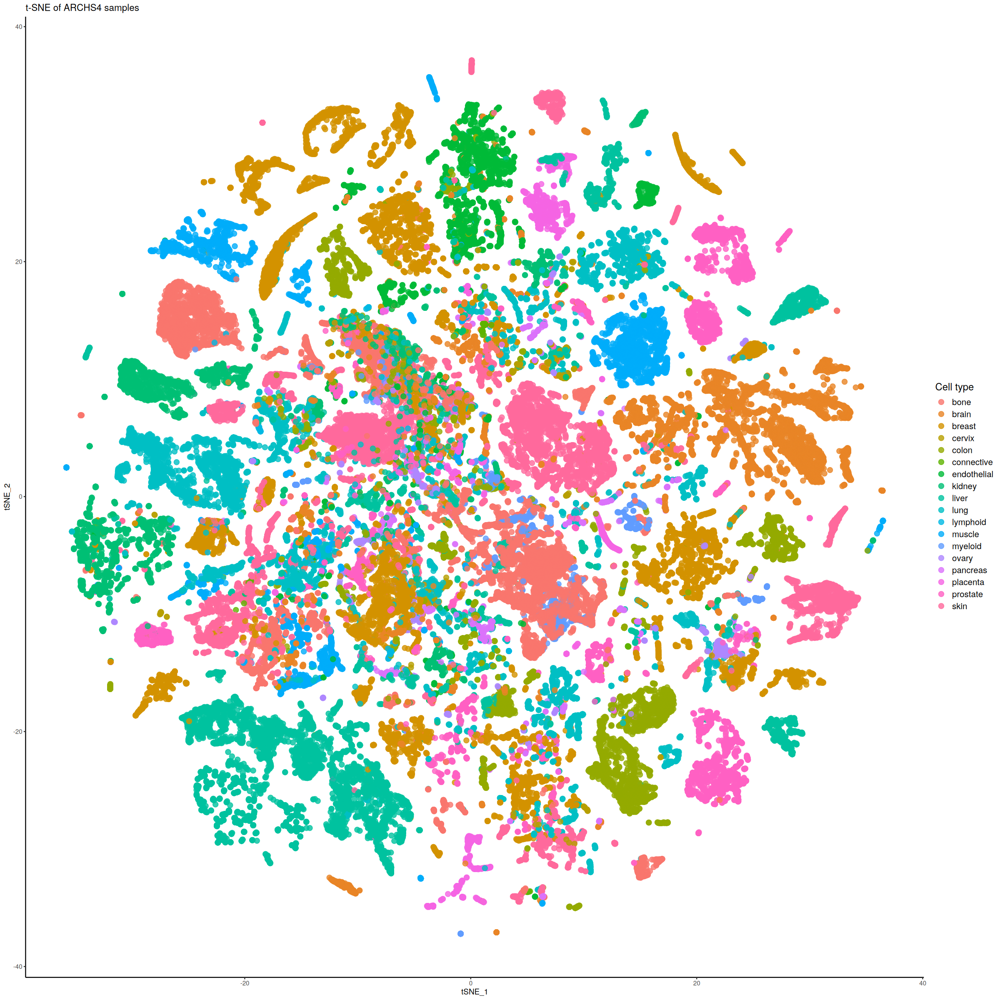

In [ ]:
ggplot(tsne_df, aes(x = tSNE_1, y = tSNE_2, color = cell_type)) +
  geom_point(size = 3, alpha = 0.8) +
  labs(title = "t-SNE of ARCHS4 samples", x = "tSNE_1", y = "tSNE_2", color = "Cell type") +
  theme_classic() +
  theme(
    legend.text = element_text(size = 12),
    legend.title = element_text(size = 14)
  )

# GTEx

In [ ]:
gtex_meta <- a4.meta.meta(
  file        = h5file,
  search_term = "GTEx",
  meta_fields = c("geo_accession", "series_id", "source_name_ch1", "characteristics_ch1"),
  remove_sc   = TRUE
) 

Field 'geo_accession': found 0 matches
Field 'series_id': found 0 matches
Field 'source_name_ch1': found 0 matches
Field 'characteristics_ch1': found 50 matches


In [ ]:
library(recount3)

human_projects <- available_projects(organism = "human")
gtex_projects  <- subset(human_projects, project_home == "data_sources/gtex")

2025-06-24 08:27:44.000728 caching file sra.recount_project.MD.gz.

2025-06-24 08:27:45.043527 caching file gtex.recount_project.MD.gz.

2025-06-24 08:27:45.817836 caching file tcga.recount_project.MD.gz.



In [ ]:
head(gtex_projects)

,project,organism,file_source,project_home,project_type,n_samples
,<chr>,<chr>,<chr>,<chr>,<chr>,<table[1d]>
8678,ADIPOSE_TISSUE,human,gtex,data_sources/gtex,data_sources,1293
8679,MUSCLE,human,gtex,data_sources/gtex,data_sources,881
8680,BLOOD_VESSEL,human,gtex,data_sources/gtex,data_sources,1398
8681,HEART,human,gtex,data_sources/gtex,data_sources,942
8682,OVARY,human,gtex,data_sources/gtex,data_sources,195
8683,UTERUS,human,gtex,data_sources/gtex,data_sources,159


In [ ]:
# load libraries
library(recount3)
library(dplyr)
library(purrr)
library(ggplot2)
library(tibble)

# 1. Grab GTEx project info
human_projects <- available_projects(organism = "human")
gtex_projects  <- subset(human_projects, project_home == "data_sources/gtex")

proj_info <- subset(gtex_projects, project == "LIVER")
rse_liver <- create_rse(proj_info, type = "gene")
samples <- colData(rse_liver)$external_sample_id
head(samples)

2025-06-24 08:27:48.718616 caching file sra.recount_project.MD.gz.

2025-06-24 08:27:49.509547 caching file gtex.recount_project.MD.gz.

2025-06-24 08:27:50.217161 caching file tcga.recount_project.MD.gz.

2025-06-24 08:27:52.458527 downloading and reading the metadata.

2025-06-24 08:27:52.926116 caching file gtex.gtex.LIVER.MD.gz.

2025-06-24 08:27:53.948693 caching file gtex.recount_project.LIVER.MD.gz.

2025-06-24 08:27:54.755269 caching file gtex.recount_qc.LIVER.MD.gz.

2025-06-24 08:27:55.666594 caching file gtex.recount_seq_qc.LIVER.MD.gz.

2025-06-24 08:27:56.594033 downloading and reading the feature information.

2025-06-24 08:27:57.031195 caching file human.gene_sums.G026.gtf.gz.

2025-06-24 08:27:57.699894 downloading and reading the counts: 251 samples across 63856 features.

2025-06-24 08:27:58.187078 caching file gtex.gene_sums.LIVER.G026.gz.

2025-06-24 08:27:59.039262 constructing the RangedSummarizedExperiment (rse) object.



NULL

In [ ]:
tail(colnames(archs4_b_sub))

[1] "GSM999586" "GSM999587" "GSM999588" "GSM999589" "GSM999590" "GSM999591"

In [ ]:
colnames(archs4_b_sub)[colnames(archs4_b_sub) %in% 'GSM2343447']

[1] "GSM2343447"

In [ ]:
colnames(colData(rse_liver))

[1] "rail_id"                                                           
  [2] "external_id"                                                       
  [3] "study"                                                             
  [4] "gtex.run_acc"                                                      
  [5] "gtex.subjid"                                                       
  [6] "gtex.sex"                                                          
  [7] "gtex.age"                                                          
  [8] "gtex.dthhrdy"                                                      
  [9] "gtex.sampid"                                                       
 [10] "gtex.smatsscr"                                                     
 [11] "gtex.smcenter"                                                     
 [12] "gtex.smpthnts"                                                     
 [13] "gtex.smrin"                                                        
 [14] "gtex.smts"                                                         
 [15] "gtex.smtsd"                                                        
 [16] "gtex.smubrid"                                                      
 [17] "gtex.smtsisch"                                                     
 [18] "gtex.smtspax"                                                      
 [19] "gtex.smnabtch"                                                     
 [20] "gtex.smnabtcht"                                                    
 [21] "gtex.smnabtchd"                                                    
 [22] "gtex.smgebtch"                                                     
 [23] "gtex.smgebtchd"                                                    
 [24] "gtex.smgebtcht"                                                    
 [25] "gtex.smafrze"                                                      
 [26] "gtex.smgtc"                                                        
 [27] "gtex.sme2mprt"                                                     
 [28] "gtex.smchmprs"                                                     
 [29] "gtex.smntrart"                                                     
 [30] "gtex.smnumgps"                                                     
 [31] "gtex.smmaprt"                                                      
 [32] "gtex.smexncrt"                                                     
 [33] "gtex.sm550nrm"                                                     
 [34] "gtex.smgnsdtc"                                                     
 [35] "gtex.smunmprt"                                                     
 [36] "gtex.sm350nrm"                                                     
 [37] "gtex.smrdlgth"                                                     
 [38] "gtex.smmncpb"                                                      
 [39] "gtex.sme1mmrt"                                                     
 [40] "gtex.smsflgth"                                                     
 [41] "gtex.smestlbs"                                                     
 [42] "gtex.smmppd"                                                       
 [43] "gtex.smnterrt"                                                     
 [44] "gtex.smrrnanm"                                                     
 [45] "gtex.smrdttl"                                                      
 [46] "gtex.smvqcfl"                                                      
 [47] "gtex.smmncv"                                                       
 [48] "gtex.smtrscpt"                                                     
 [49] "gtex.smmppdpr"                                                     
 [50] "gtex.smcglgth"                                                     
 [51] "gtex.smgappct"                                                     
 [52] "gtex.smunpdrd"                                                     
 [53] "gtex.smntrnrt"                                                     
 [54] "gtex.smmpunrt"      

In [ ]:
head(rse_liver$external_id)

[1] "GTEX-14PJO-1726-SM-68719.1" "GTEX-17HII-1026-SM-7IGLY.1"
[3] "GTEX-18A7A-1526-SM-72D69.1" "GTEX-1GF9V-1226-SM-7MKGY.1"
[5] "GTEX-1GN1U-0926-SM-9WPPY.1" "GTEX-1GZ4I-1526-SM-9OSW9.1"

In [ ]:
head(rse_liver$gtex.subjid)

[1] "GTEX-14PJO" "GTEX-17HII" "GTEX-18A7A" "GTEX-1GF9V" "GTEX-1GN1U"
[6] "GTEX-1GZ4I"

In [ ]:
colData(rse_liver)  %>% head()

DataFrame with 6 rows and 198 columns
                             rail_id            external_id       study
                           <integer>            <character> <character>
GTEX-14PJO-1726-SM-68719.1  10045027 GTEX-14PJO-1726-SM-6..       LIVER
GTEX-17HII-1026-SM-7IGLY.1  10045100 GTEX-17HII-1026-SM-7..       LIVER
GTEX-18A7A-1526-SM-72D69.1  10045115 GTEX-18A7A-1526-SM-7..       LIVER
GTEX-1GF9V-1226-SM-7MKGY.1  10045203 GTEX-1GF9V-1226-SM-7..       LIVER
GTEX-1GN1U-0926-SM-9WPPY.1  10045216 GTEX-1GN1U-0926-SM-9..       LIVER
GTEX-1GZ4I-1526-SM-9OSW9.1  10045230 GTEX-1GZ4I-1526-SM-9..       LIVER
                           gtex.run_acc gtex.subjid  gtex.sex    gtex.age
                            <character> <character> <integer> <character>
GTEX-14PJO-1726-SM-68719.1           NA  GTEX-14PJO         1       60-69
GTEX-17HII-1026-SM-7IGLY.1           NA  GTEX-17HII         1       50-59
GTEX-18A7A-1526-SM-72D69.1           NA  GTEX-18A7A         2       50-59
GTEX-1GF9V-1226-

In [ ]:
library(stringr)

gtex_meta <- a4.meta.meta(
  file        = h5file,
  search_term = "GTEx",
  meta_fields = c("series_id", "source_name_ch1", "characteristics_ch1"),
  remove_sc   = TRUE
)

Field 'series_id': found 0 matches
Field 'source_name_ch1': found 0 matches
Field 'characteristics_ch1': found 50 matches


In [ ]:
gtex_meta

,series_id,source_name_ch1,characteristics_ch1
GSM2343107,GSE87964,Homo sapiens thyroid gland tissue male adult (54 years),"tissue_type: thyroid gland,biomaterial_type: tissue,description: Thyroid Gland GTEx tissue aliquot received by the Gingeras lab to conduct RNA-Seq assays on.,biosample encode accession: ENCBS624WYQ (SAMN05897384),age: 54 year,dev stage: adult,donor_id: ENCDO451RUA,Sex: male,lab: Thomas Gingeras, CSHL,link: ENCBS624WYQ at ENCODE; https://www.encodeproject.org/ENCBS624WYQ/,link: Derived from ENCODE donor ENCDO451RUA; https://www.encodeproject.org/ENCDO451RUA/"
GSM2343108,GSE87964,Homo sapiens thyroid gland tissue male adult (54 years),"tissue_type: thyroid gland,biomaterial_type: tissue,description: Thyroid Gland GTEx tissue aliquot received by the Gingeras lab to conduct RNA-Seq assays on.,biosample encode accession: ENCBS624WYQ (SAMN05897384),age: 54 year,dev stage: adult,donor_id: ENCDO451RUA,Sex: male,lab: Thomas Gingeras, CSHL,link: ENCBS624WYQ at ENCODE; https://www.encodeproject.org/ENCBS624WYQ/,link: Derived from ENCODE donor ENCDO451RUA; https://www.encodeproject.org/ENCDO451RUA/"
GSM2343109,GSE87965,Homo sapiens ovary tissue female adult (51 year),"tissue_type: ovary,biomaterial_type: tissue,description: Ovary tissue from received by the Gingeras lab to do RNA-Seq assay on from GTEx.,biosample encode accession: ENCBS711CPB (SAMN05897475),age: 51 year,dev stage: adult,donor_id: ENCDO271OUW,Sex: female,lab: Thomas Gingeras, CSHL,link: ENCBS711CPB at ENCODE; https://www.encodeproject.org/ENCBS711CPB/,link: Derived from ENCODE donor ENCDO271OUW; https://www.encodeproject.org/ENCDO271OUW/"
GSM2343125,GSE87976,Homo sapiens body of pancreas tissue female adult (53 years),"tissue_type: body of pancreas,biomaterial_type: tissue,description: Pancreas tissue from received by the Gingeras lab to do RNA-Seq assay on from GTEx.,biosample encode accession: ENCBS273XDV (SAMN05897043),age: 53 year,dev stage: adult,donor_id: ENCDO793LXB,Sex: female,lab: Thomas Gingeras, CSHL,link: ENCBS273XDV at ENCODE; https://www.encodeproject.org/ENCBS273XDV/,link: Derived from ENCODE donor ENCDO793LXB; https://www.encodeproject.org/ENCDO793LXB/"
GSM2343138,GSE87984,Homo sapiens ovary tissue female adult (51 year),"tissue_type: ovary,biomaterial_type: tissue,description: Ovary tissue from received by the Gingeras lab to do RNA-Seq assay on from GTEx.,biosample encode accession: ENCBS711CPB (SAMN05897475),age: 51 year,dev stage: adult,donor_id: ENCDO271OUW,Sex: female,lab: Thomas Gingeras, CSHL,link: ENCBS711CPB at ENCODE; https://www.encodeproject.org/ENCBS711CPB/,link: Derived from ENCODE donor ENCDO271OUW; https://www.encodeproject.org/ENCDO271OUW/"
GSM2343213,GSE88025,Homo sapiens esophagus muscularis mucosa tissue female adult (53 years),"tissue_type: esophagus muscularis mucosa,biomaterial_type: tissue,description: Esophagus muscle layer tissue sent from GTEx to the Gingeras lab to conduct RNA-Seq assays on.,biosample encode accession: ENCBS571LWZ (SAMN05897325),age: 53 year,dev stage: adult,donor_id: ENCDO793LXB,Sex: female,lab: Thomas Gingeras, CSHL,link: ENCBS571LWZ at ENCODE; https://www.encodeproject.org/ENCBS571LWZ/,link: Derived from ENCODE donor ENCDO793LXB; https://www.encodeproject.org/ENCDO793LXB/"
GSM2343216,GSE88027,Homo sapiens body of pancreas tissue female adult (51 year),"tissue_type: body of pancreas,biomaterial_type: tissue,description: Pancreas tissue from received by the Gingeras lab to do RNA-Seq assay on from GTEx.,biosample encode accession: ENCBS389HVX (SAMN05897145),age: 51 year,dev stage: adult,donor_id: ENCDO271OUW,Sex: female,lab: Thomas Gingeras, CSHL,link: ENCBS389HVX at ENCODE; https://www.encodeproject.org/ENCBS389HVX/,link: Derived from ENCODE donor ENCDO271OUW; https://www.encodeproject.org/ENCDO271OUW/"
GSM2343350,GSE88090,Homo sapiens esophagus muscularis mucosa tissue male adult (37 years),"tissue_type: esophagus muscularis mucosa,biomaterial_type: tissue,description: Esophagus muscle l

In [ ]:
library(stringr)

gtex_meta_df <- as.data.frame(gtex_meta, stringsAsFactors = FALSE)

gtex_tissue_df <- data.frame(
  tissue = str_extract(gtex_meta_df$characteristics_ch1, "(?<=tissue_type: )[^,]+"),
  row.names = rownames(gtex_meta_df),
  stringsAsFactors = FALSE
)

table(gtex_tissue_df$tissue)


                adrenal gland              body of pancreas 
                            4                             4 
  esophagus muscularis mucosa        gastrocnemius medialis 
                            7                             5 
         heart left ventricle                         ovary 
                            2                             3 
right atrium auricular region           right lobe of liver 
                            2                             4 
               thoracic aorta                 thyroid gland 
                            2                             4 
                 tibial nerve       upper lobe of left lung 
                            5                             8 

In [ ]:
gtex_tissue_df

,tissue
,<chr>
GSM2343107,thyroid gland
GSM2343108,thyroid gland
GSM2343109,ovary
GSM2343125,body of pancreas
GSM2343138,ovary
GSM2343213,esophagus muscularis mucosa
GSM2343216,body of pancreas
GSM2343350,esophagus muscularis mucosa
GSM2343393,tibial nerve


In [ ]:
# KEEP

In [ ]:
data.frame(archs4_b["LV165",])  %>% 
t() %>% 
data.frame() %>% 
dplyr::arrange(desc(LV165)) %>% 
head(500)  %>% 
tibble::rownames_to_column('sample_id')  %>% 
dplyr::inner_join(df_cell_types_info)

Joining with `by = join_by(sample_id)`


sample_id,LV165,title,source_name_ch1
<chr>,<dbl>,<chr>,<chr>
GSM1560593,0.4365942,Day 16 b5b,"H1 human embryonic stem cell derived neural progenitor cells, endothelial cells, mesenchymal stem cells, and microglia/macrophage precursors"
GSM1560736,0.4297721,Day 21 b5a,"H1 human embryonic stem cell derived neural progenitor cells, endothelial cells, mesenchymal stem cells, and microglia/macrophage precursors"
GSM1560737,0.4276452,Day 21 b5b,"H1 human embryonic stem cell derived neural progenitor cells, endothelial cells, mesenchymal stem cells, and microglia/macrophage precursors"
GSM1560592,0.4221300,Day 16 b5a,"H1 human embryonic stem cell derived neural progenitor cells, endothelial cells, mesenchymal stem cells, and microglia/macrophage precursors"
GSM8054336,0.3444704,"scleroderma skin derived fibroblast, LiCL, Donor3",scleroderma skin derived fibroblast
GSM8054338,0.3323579,"scleroderma skin derived fibroblast, LiCL, Donor4",scleroderma skin derived fibroblast
GSM8054332,0.3301907,"scleroderma skin derived fibroblast, LiCL, Donor1",scleroderma skin derived fibroblast
GSM8054334,0.3184694,"scleroderma skin derived fibroblast, LiCL, Donor2",scleroderma skin derived fibroblast
GSM8054340,0.3015724,"scleroderma skin derived fibroblast, LiCL, Donor5",scleroderma skin derived fibroblast
